In [93]:
#Import the Necessary Libraries
import sympy as sm 
import sympy.physics.mechanics as me 
me.init_vprinting(use_latex="mathjax")
import numpy as np
import scipy as sp 
import scipy.optimize as so 
import scipy.integrate as si
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib as litt
litt.rcParams['animation.embed_limit'] = 50.0

In [2]:
#Setting the variables and Reference Frames and points
N=me.ReferenceFrame("N")
A=me.ReferenceFrame("A")
B=me.ReferenceFrame("B")
q1, q2=me.dynamicsymbols("q_1,q_2")
l1, l2=sm.symbols("l_1, l_2")

In [21]:
#Initialize the matrices 
q_m=sm.Matrix([q1, q2])
q_m_d=sm.Matrix([q1.diff(), q2.diff()])
s=[l1, l2]

In [4]:
#Orientations and define positions 
o=me.Point("O")
p1=me.Point("P1")
p2=me.Point("P2")
A.orient_axis(N, N.z, q1)
B.orient_axis(A, A.z, q2)
p1.set_pos(o, l1*A.x)
p2.set_pos(p1, l2*B.x)

In [5]:
#Setting the vectors
r_p1_o=p1.pos_from(o)
r_p2_p1=p1.pos_from(p1)
r_p2_o=p2.pos_from(o)
pos=r_p1_o+r_p2_p1-r_p2_o
x_e=r_p2_o.dot(N.x)
y_e=r_p2_o.dot(N.y)

In [85]:
#FK- Finding Position xe, ye using vectors formulated- Lambification
eval=sm.Matrix([x_e, y_e])
e_end=sm.lambdify([q_m, s], eval)
p=np.array([1, 1.2])            #   in m
q_a=np.linspace(0, 2*np.pi, 360)    # in rads

In [86]:
'''Since the Mechanism DOF=2, we have two indepenendant coordinates to simulate'''
#Sim-1: Simulate with fixed q_2. 
q_2=np.array([-np.pi/3])

def sol_pos(q_a, q_2, p): 
    ls=[]
    for i in q_a: 
        mi=np.hstack([i, q_2])
        so_m=e_end(mi, p)
        ls+=[[so_m[0], so_m[1]]]
    ls=np.array(ls)
    return ls
y=sol_pos(q_a, q_2, p)
x_s=y[:,0]
y_s=y[:, 1]

In [87]:
#Kinematic Quantities- v_e_N, a_e_N
q_ms_d=np.array([np.pi*2/20, 0])
e_v=sm.Matrix([r_p2_o.dt(N).dot(N.x), r_p2_o.dt(N).dot(N.y)])
vel_e=sm.lambdify([q_m, s, q_m_d], e_v)

In [88]:
def vel_es(q_a, q2, p, q_ms_d): 
    ls=[]
    for j in q_a: 
        q_m1=np.hstack([j, q2])
        v_e_x, v_ey=vel_e(q_m1, p, q_ms_d)
        vn=np.sqrt(np.square(v_e_x)+np.square(v_ey))
        ls+=[vn]
    ls=np.array(ls)
    return ls
sol_v=vel_es(q_a, q_2, p, q_ms_d)
sol_v
sol_v

array([[0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.59937768],
       [0.599

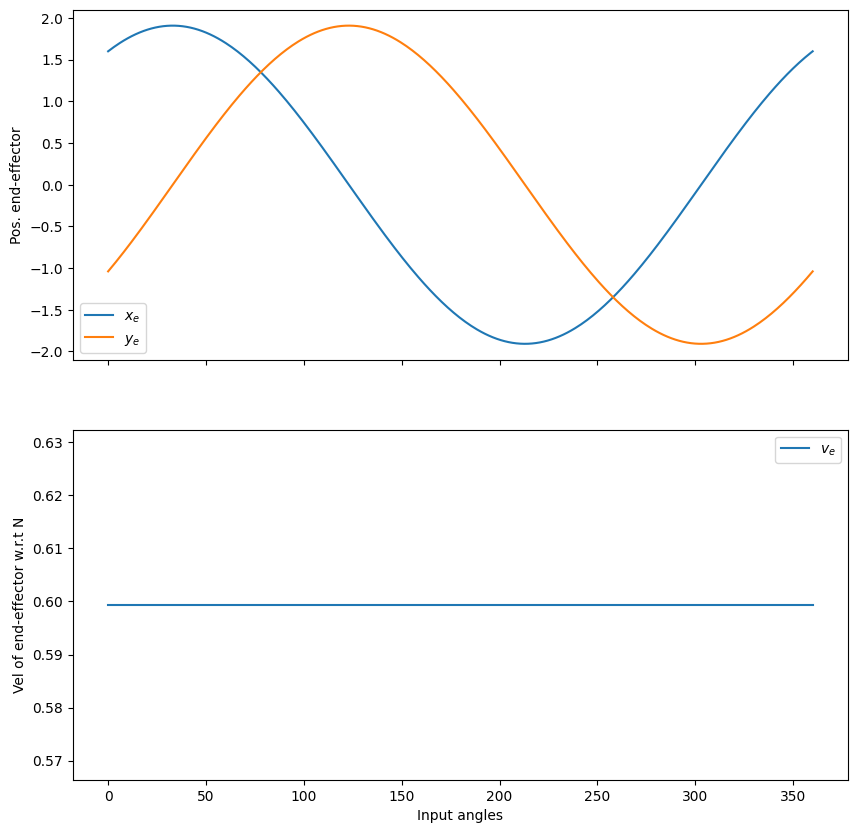

In [89]:
#Velocity pos plots 
def plot(y, sol_v, q_a): 
    fig, axes=plt.subplots(2, 1, sharex=True)
    fig.set_size_inches(10, 10)
    axes[0].plot(np.rad2deg(q_a), y[:,0], label=r"$x_e$")
    axes[0].plot(np.rad2deg(q_a), y[:,1], label=r"$y_e$")
    axes[1].plot(np.rad2deg(q_a), sol_v, label=r"$v_e$")
    axes[0].legend()
    axes[1].legend()
    axes[0].set_ylabel("Pos. end-effector")
    axes[1].set_ylabel("Vel of end-effector w.r.t N")
    axes[1].set_xlabel("Input angles")
plot(y, sol_v, q_a)

(<Axes: title={'center': 'Time = 0.0 s'}, xlabel='$x$ [m]', ylabel='$y$ [m]'>,
 <Figure size 1000x1000 with 1 Axes>,
 Text(0.5, 1.0, 'Time = 0.0 s'))

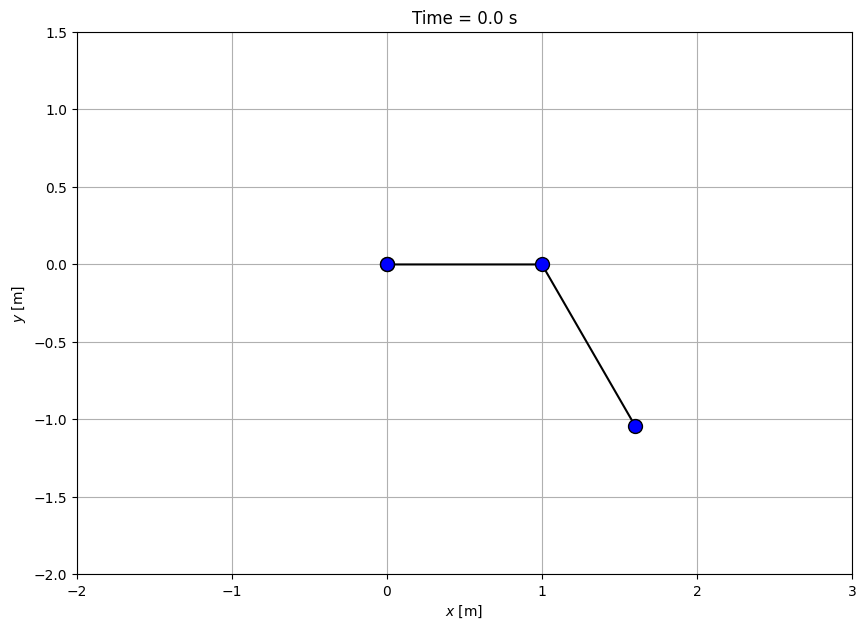

In [97]:
#Simulation-Visualization
ls=[o, p1, p2]
coord=o.pos_from(o).to_matrix(N)
for i in ls:
    coord=coord.row_join(i.pos_from(o).to_matrix(N))
e_c=sm.lambdify([q_m, s], coord)
def e_pos_an(q_a, q_2, p): 
    ls=np.hstack([q_a[0], q_2])
    x_p, y_p, z_p=e_c(ls, p)
    ts=np.linspace(0, 20, 360)
    fig, axes=plt.subplots()                      
    fig.set_size_inches(10, 10)
    axes.set_aspect("equal")
    axes.grid()                     
    lines, = axes.plot(x_p, y_p, color='black',
                     marker='o', markerfacecolor='blue', markersize=10)
    title_text = axes.set_title('Time = {:1.1f} s'.format(ts[0]))
    axes.set_xlim((-2.0, 3.0))
    axes.set_ylim((-2.0, 1.5))
    axes.set_xlabel('$x$ [m]')
    axes.set_ylabel('$y$ [m]')
    return axes, fig, lines, title_text
e_pos_an(q_a, q_2, p)

In [104]:
def animation(q_a, q_2, p):
    axes, fig, lines, title_text=e_pos_an(q_a, q_2, p)
    coords=[]
    ts=np.linspace(0,20,360)
    for i in q_a: 
        sub=np.hstack([i, q_2])
        res=e_c(sub,p)
        coords.append(res)
        print(res[:,3])
    print(ts)
    coords=np.array(coords)
    def update(j):
        title_text.set_text('Time = {:1.1f} s'.format(ts[j]))
        lines.set_data(coords[j, 0, :], coords[j, 1, :])
    plt.close()
    return FuncAnimation(fig, update, len(ts))
HTML(animation(q_a, q_2, p).to_jshtml(fps=20))

[ 1.6        -1.03923048  0.        ]
[ 1.61794254 -1.0110697   0.        ]
[ 1.63538949 -0.98259921  0.        ]
[ 1.65233551 -0.95382774  0.        ]
[ 1.6687754  -0.92476411  0.        ]
[ 1.68470413 -0.89541722  0.        ]
[ 1.70011682 -0.86579605  0.        ]
[ 1.71500875 -0.83590967  0.        ]
[ 1.72937536 -0.80576726  0.        ]
[ 1.74321224 -0.77537802  0.        ]
[ 1.75651516 -0.74475129  0.        ]
[ 1.76928005 -0.71389643  0.        ]
[ 1.78150299 -0.68282289  0.        ]
[ 1.79318024 -0.6515402   0.        ]
[ 1.80430822 -0.62005794  0.        ]
[ 1.81488352 -0.58838575  0.        ]
[ 1.82490291 -0.55653333  0.        ]
[ 1.83436332 -0.52451044  0.        ]
[ 1.84326185 -0.49232689  0.        ]
[ 1.85159576 -0.45999254  0.        ]
[ 1.85936252 -0.42751728  0.        ]
[ 1.86655974 -0.39491107  0.        ]
[ 1.87318521 -0.3621839   0.        ]
[ 1.87923691 -0.32934579  0.        ]
[ 1.88471298 -0.29640679  0.        ]
[ 1.88961175 -0.263377    0.        ]
[ 1.89393171